<a href="https://colab.research.google.com/github/fayazshaik786/AndroidOnlineDictionary/blob/master/pathogen_detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import numpy as np

In [0]:
import pandas as pd

In [0]:
from google.colab import drive


In [0]:
from google.colab import files


In [5]:
files.upload()

Saving 8f86dc50-7-dataset.zip to 8f86dc50-7-dataset.zip


{'8f86dc50-7-dataset.zip': b'PK\x03\x04\x14\x00\x00\x00\x08\x006d\xb1N\xaeK\xa9b\xa7\x00\x00\x00\x85\x08\x00\x00\n\x00\x00\x00sample.csv\x95\xd1+\x12\x02Q\x0cDQO\x15;\x89xIz\xf8H\xbeS\xb8\x14\xfb_\x0c\x18D\x0co\xae\xe9jq\xddy\xdd\xad.VW\xab\x9b\xd5\xf7?\xac\x9eV\xeb~Wo\x8d1\xdc<<\xfe\xcf\xaf\x9dd\xadM\xd0\n\xb4\x0bh\x0f\xa0=\x82\xf6\x04\xda\xf3\xf6\xd6\x07h\x81\xdb,k-ps\xe0\xe6\xc0\xcd\x81\x9b\x037\x07n\x0e\xdc\x02\xb8\x05p\x8bI\xd6Z\xe0\x16\xc0-\x80[\x00\xb7\x00n\x01\xdc\x02\xb8%pK\xe0\x96\x93\xac\xb5\xc0-\x81[\x02\xb7\x04n\t\xdc\x12\xb8%p\x13p\x13p\xd3$k-p\x13p\x13p\x13p\x13p\x13p\xd36\xb7\x0fPK\x03\x04\x14\x00\x00\x00\x08\x00l\x95\xadN\x02\x1b\x9e\x08\x05u\x0b\x00\xa2\xab0\x00\x08\x00\x00\x00test.csv\x9c\xbd\xdb\xae,;\x92\x1c\xf8>\xc0\xfc\xc3|@V"xg\xe8M\xa3\xda@\x170sF\xe8\xd3\xc0~n\xa8\x0bP\x01R\xa9\xd1S\ri\xfe~\xd2\xcd\x8c\x0c\x92\xc1\x15\xeb\x9cB-p\xe7\xa9\xc5\xbd\xc3\x92\xe1t\xfa\xc5\xdc\xf9\xa7?\xbe\xfe\xf8\xcf\x7f\xfb\xf3?\xfd\xe5\xbf\xff\xf9\xf5O\x7f\xfe\xef\xff\xfa\xff\xfc\x

In [6]:
files.upload()

Saving train.csv to train.csv


{'train.csv': b'ID,DateTime,TempOut,HiTemp,LowTemp,OutHum,DewPt,WindSpeed,WindDir,WindRun,HiSpeed,HiDir,WindChill,HeatIndex,THWIndex,Bar,Rain,RainRate,HeatDD,CoolDD,InTemp,InHum,InDew,InHeat,InEMC,InAirDensity,WindSamp,WindTx,ISSRecpt,ArcInt,PA,PB,PC,PD,PE,PF,PG\r\nPR00001,07-12-2040 0:15,53.5,53.6,53.5,85,49.1,2,SSE,0.5,9,SE,53.5,53.4,53.4,29.951,0,0,0.12,0,70.2,50,50.7,68.6,9.25,0.074,350,1,100,15,1,1,1,1,1,1,1\r\nPR00002,07-12-2040 0:30,53.5,53.5,53.4,85,49.1,2,SSE,0.5,7,SSE,53.5,53.4,53.4,29.955,0,0,0.12,0,69.3,27,33.9,65.4,5.85,0.0746,352,1,100,15,1,1,1,1,1,1,1\r\nPR00003,07-12-2040 0:45,53.3,53.5,53.2,85,48.9,2,SSE,0.5,7,SSE,53.3,53.2,53.2,29.954,0,0,0.122,0,68.4,53,50.6,67.3,9.88,0.0743,351,1,100,15,1,1,1,1,1,1,1\r\nPR00004,07-12-2040 1:00,53.1,53.3,53,86,49,2,S,0.5,5,S,53.1,53,53,29.956,0,0,0.124,0,69.8,50,50.3,68.2,9.25,0.0741,351,1,100,15,1,1,1,1,1,1,1\r\nPR00005,07-12-2040 1:15,52.9,53.1,52.9,86,48.8,2,S,0.5,6,SW,52.9,52.9,52.9,29.959,0,0,0.126,0,71,48,50.3,69.4,8.87,0.074,3

In [0]:
pathogen = pd.read_csv('train.csv')

In [15]:
pathogen

,ID,DateTime,TempOut,HiTemp,LowTemp,OutHum,DewPt,WindSpeed,WindDir,WindRun,HiSpeed,HiDir,WindChill,HeatIndex,THWIndex,Bar,Rain,RainRate,HeatDD,CoolDD,InTemp,InHum,InDew,InHeat,InEMC,InAirDensity,WindSamp,WindTx,ISSRecpt,ArcInt,PA,PB,PC,PD,PE,PF,PG
0,PR00001,07-12-2040 0:15,53.5,53.6,53.5,85,49.1,2,SSE,0.50,9,SE,53.5,53.4,53.4,29.951,0.0,0.0,0.120,0.000,70.2,50,50.7,68.6,9.25,0.0740,350,1,100.0,15,1,1,1,1,1,1,1
1,PR00002,07-12-2040 0:30,53.5,53.5,53.4,85,49.1,2,SSE,0.50,7,SSE,53.5,53.4,53.4,29.955,0.0,0.0,0.120,0.000,69.3,27,33.9,65.4,5.85,0.0746,352,1,100.0,15,1,1,1,1,1,1,1
2,PR00003,07-12-2040 0:45,53.3,53.5,53.2,85,48.9,2,SSE,0.50,7,SSE,53.3,53.2,53.2,29.954,0.0,0.0,0.122,0.000,68.4,53,50.6,67.3,9.88,0.0743,351,1,100.0,15,1,1,1,1,1,1,1
3,PR00004,07-12-2040 1:00,53.1,53.3,53.0,86,49.0,2,S,0.50,5,S,53.1,53.0,53.0,29.956,0.0,0.0,0.124,0.000,69.8,50,50.3,68.2,9.25,0.0741,351,1,100.0,15,1,1,1,1,1,1,1
4,PR00005,07-12-2040 1:15,52.9,53.1,52.9,86,48.8,2,S,0.50,6,SW,52.9,52.9,52.9,29.959,0.0,0.0,0.126,0.000,71.0,48,50.3,69.4,8.87,0.0740,351,1,100.0,15,1,1,1,1,1,1,1
5,PR00006,07-12-2040 1:30,52.8,53.0,52.7,87,49.0,2,S,0.50,6,SSE,52.8,52.8,52.8,29.957,0.0,0.0,0.127,0.000,67.6,59,52.8,67.1,10.95,0.0743,351,1,100.0,15,1,1,1,1,1,1,1
6,PR00007,07-12-2040 1:45,52.6,52.8,52.6,87,48.8,1,SSE,0.25,5,SSE,52.6,52.6,52.6,29.955,0.0,0.0,0.129,0.000,68.3,52,50.0,67.2,9.68,0.0743,352,1,100.0,15,1,1,1,1,1,1,1
7,PR00008,07-12-2040 2:00,52.5,52.6,52.5,87,48.7,2,S,0.50,5,S,52.5,52.5,52.5,29.960,0.0,0.0,0.130,0.000,69.8,50,50.3,68.2,9.25,0.0741,351,1,100.0,15,1,1,1,1,1,1,1
8,PR00009,07-12-2040 2:15,52.3,52.5,52.2,88,48.9,2,S,0.50,4,SSE,52.3,52.4,52.4,29.959,0.0,0.0,0.132,0.000,70.8,48,50.1,69.1,8.87,0.0740,351,1,100.0,15,1,1,1,1,1,1,1
9,PR00010,07-12-2040 2:30,52.1,52.3,52.1,88,48.7,1,SW,0.25,3,SSW,52.1,52.2,52.2,29.953,0.0,0.0,0.134,0.000,68.6,57,52.8,67.9,10.58,0.0742,351,1,100.0,15,1,1,1,1,1,1,1


In [0]:
pa = pathogen['PA']

In [17]:
pa


0           1
1           1
2           1
3           1
4           1
5           1
6           1
7           1
8           1
9           1
10          1
11          1
12          1
13          1
14          1
15          1
16          1
17          1
18          1
19          1
20          1
21          1
22          1
23          1
24          1
25          1
26          1
27          1
28          1
29          1
         ... 
39970    2963
39971    2964
39972    2964
39973    2965
39974    2965
39975    2966
39976    2967
39977    2967
39978    2968
39979    2968
39980    2969
39981    2970
39982    2970
39983    2971
39984    2971
39985    2972
39986    2973
39987    2973
39988    2974
39989    2974
39990    2975
39991    2976
39992    2976
39993    2977
39994    2977
39995    2978
39996    2979
39997    2979
39998    2980
39999    2980
Name: PA, Length: 40000, dtype: int64

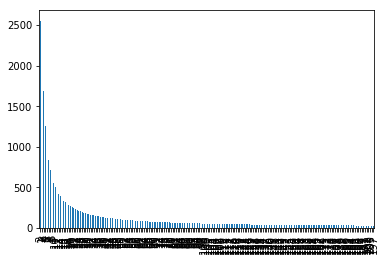

In [31]:
pa.value_counts().head(200).plot.bar()

In [20]:
pa.value_counts()

2       2554
1       2028
3       1682
4       1257
5       1003
6        836
7        715
8        626
9        556
10       500
11       455
12       417
13       385
14       357
15       334
16       312
17       295
18       277
19       264
20       250
21       238
22       227
23       218
24       208
25       200
26       192
27       185
28       179
29       172
30       167
        ... 
2743       1
2775       1
2922       1
2839       1
2871       1
2890       1
2875       1
2843       1
2646       1
2754       1
2883       1
2915       1
2901       1
2933       1
2852       1
2949       1
2760       1
2978       1
2826       1
2972       1
2856       1
2908       1
2946       1
2966       1
2780       1
2818       1
2556       1
2524       1
2765       1
2616       1
Name: PA, Length: 2980, dtype: int64

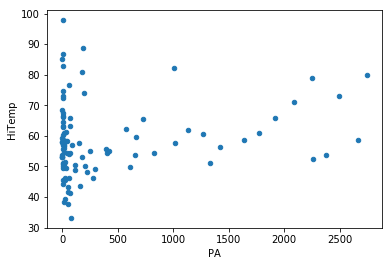

In [22]:
pathogen.sample(100).plot.scatter(x='PA',y='HiTemp')

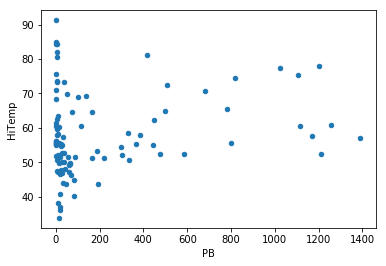

In [23]:
pathogen.sample(100).plot.scatter(x='PB',y='HiTemp')

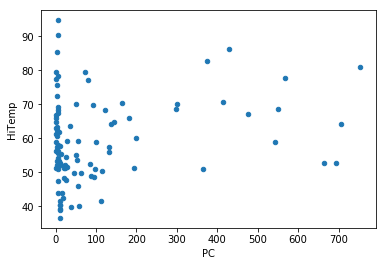

In [24]:
pathogen.sample(100).plot.scatter(x='PC',y='HiTemp')

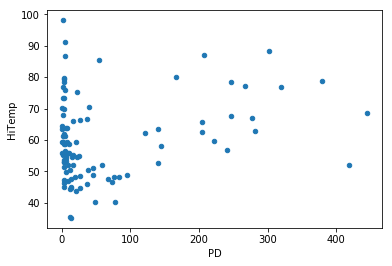

In [25]:
pathogen.sample(100).plot.scatter(x='PD',y='HiTemp')

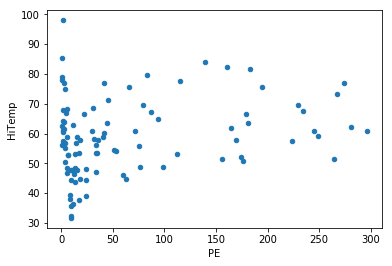

In [26]:
pathogen.sample(100).plot.scatter(x='PE',y='HiTemp')

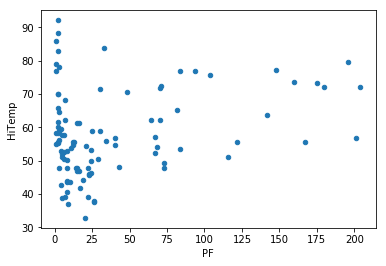

In [27]:
pathogen.sample(100).plot.scatter(x='PF',y='HiTemp')

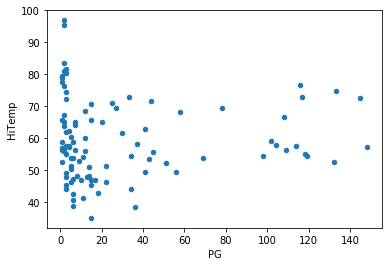

In [28]:
pathogen.sample(100).plot.scatter(x='PG',y='HiTemp')

In [32]:
pathogen.corr(method ='pearson') 

,TempOut,HiTemp,LowTemp,OutHum,DewPt,WindSpeed,WindRun,HiSpeed,WindChill,HeatIndex,THWIndex,Bar,Rain,RainRate,HeatDD,CoolDD,InTemp,InHum,InDew,InHeat,InEMC,InAirDensity,WindSamp,WindTx,ISSRecpt,ArcInt,PA,PB,PC,PD,PE,PF,PG
TempOut,1.000000,0.999016,0.997934,-0.760999,0.514769,0.505322,0.505322,0.543677,0.999008,0.997370,0.995851,-0.461918,-0.050903,-0.028509,-0.906713,0.812657,0.255057,0.352215,0.352881,0.371995,0.370243,-0.529985,0.009362,NaN,-0.002226,NaN,0.191000,0.187726,0.183378,0.178264,0.172692,0.167018,0.160992
HiTemp,0.999016,1.000000,0.997799,-0.766949,0.508606,0.511188,0.511188,0.549135,0.997832,0.995947,0.994233,-0.458020,-0.051348,-0.027927,-0.906282,0.811218,0.252502,0.348104,0.347980,0.367774,0.366682,-0.524843,0.009662,NaN,-0.001991,NaN,0.189183,0.185948,0.181650,0.176595,0.171085,0.165473,0.159520
LowTemp,0.997934,0.997799,1.000000,-0.753150,0.519205,0.511173,0.511173,0.547212,0.996875,0.995686,0.994098,-0.472548,-0.048493,-0.027103,-0.904976,0.810793,0.260118,0.360255,0.361569,0.380134,0.378266,-0.541762,0.008767,NaN,-0.002441,NaN,0.192722,0.189445,0.185079,0.179935,0.174330,0.168609,0.162535
OutHum,-0.760999,-0.766949,-0.753150,1.000000,0.123583,-0.483666,-0.483666,-0.513849,-0.753988,-0.719567,-0.712198,0.184441,0.119878,0.066848,0.643986,-0.681985,-0.055091,0.100589,0.132695,0.017682,0.070093,0.092717,-0.010563,NaN,0.000475,NaN,-0.030012,-0.028772,-0.027217,-0.025561,-0.023830,-0.021923,-0.020060
DewPt,0.514769,0.508606,0.519205,0.123583,1.000000,0.178021,0.178021,0.193896,0.520461,0.567098,0.572402,-0.435954,0.052214,0.029376,-0.591367,0.246171,0.337366,0.669406,0.714152,0.607411,0.659130,-0.682201,0.000133,NaN,-0.004275,NaN,0.273815,0.272070,0.268943,0.264630,0.259584,0.254393,0.248483
WindSpeed,0.505322,0.511188,0.511173,-0.483666,0.178021,1.000000,1.000000,0.948606,0.478957,0.496802,0.469651,-0.249040,0.023834,0.023174,-0.496716,0.357405,0.140867,0.148144,0.139246,0.188282,0.166107,-0.271240,0.009987,NaN,0.000697,NaN,0.168522,0.174726,0.179822,0.183923,0.187322,0.189769,0.191620
WindRun,0.505322,0.511188,0.511173,-0.483666,0.178021,1.000000,1.000000,0.948606,0.478957,0.496802,0.469651,-0.249040,0.023834,0.023174,-0.496716,0.357405,0.140867,0.148144,0.139246,0.188282,0.166107,-0.271240,0.009987,NaN,0.000697,NaN,0.168522,0.174726,0.179822,0.183923,0.187322,0.189769,0.191620
HiSpeed,0.543677,0.549135,0.547212,-0.513849,0.193896,0.948606,0.948606,1.000000,0.520948,0.534048,0.510594,-0.275966,0.044101,0.038534,-0.539193,0.377932,0.143024,0.159624,0.148647,0.195540,0.176711,-0.291968,0.007825,NaN,-0.002227,NaN,0.188452,0.194424,0.199268,0.203073,0.206150,0.208321,0.209852
WindChill,0.999008,0.997832,0.996875,-0.753988,0.520461,0.478957,0.478957,0.520948,1.000000,0.996876,0.997382,-0.460466,-0.053586,-0.030716,-0.905193,0.812710,0.253080,0.356257,0.356759,0.372236,0.374025,-0.529707,0.009072,NaN,-0.002392,NaN,0.192529,0.189074,0.184545,0.179250,0.173505,0.167670,0.161490
HeatIndex,0.997370,0.995947,0.995686,-0.719567,0.567098,0.496802,0.496802,0.534048,0.996876,1.000000,0.998967,-0.474350,-0.045456,-0.025454,-0.903098,0.812221,0.260556,0.388492,0.389929,0.394544,0.406247,-0.554087,0.009049,NaN,-0.002330,NaN,0.202921,0.199536,0.195032,0.189718,0.183918,0.178023,0.171754


In [33]:
pathogen.corr(method ='kendall') 

,TempOut,HiTemp,LowTemp,OutHum,DewPt,WindSpeed,WindRun,HiSpeed,WindChill,HeatIndex,THWIndex,Bar,Rain,RainRate,HeatDD,CoolDD,InTemp,InHum,InDew,InHeat,InEMC,InAirDensity,WindSamp,WindTx,ISSRecpt,ArcInt,PA,PB,PC,PD,PE,PF,PG
TempOut,1.000000,0.979221,0.972375,-0.534411,0.488548,0.422476,0.422476,0.430548,0.985515,0.963142,0.951193,-0.314107,-0.063191,-0.050350,-0.966623,0.667082,0.096429,0.276629,0.309319,0.257415,0.272380,-0.360711,0.011942,NaN,-0.003423,NaN,-0.024735,-0.025128,-0.026031,-0.026216,-0.026159,-0.024554,-0.024319
HiTemp,0.979221,1.000000,0.966364,-0.542509,0.479301,0.426200,0.426200,0.434134,0.967012,0.949285,0.937763,-0.310619,-0.064070,-0.051127,-0.949346,0.660576,0.095823,0.271237,0.303570,0.253078,0.267079,-0.355715,0.012047,NaN,-0.003208,NaN,-0.024486,-0.024876,-0.025753,-0.025922,-0.025865,-0.024282,-0.024028
LowTemp,0.972375,0.966364,1.000000,-0.525580,0.494280,0.424851,0.424851,0.431766,0.961373,0.952433,0.940779,-0.322190,-0.060338,-0.047839,-0.943770,0.657866,0.097512,0.284461,0.317882,0.264311,0.280080,-0.370356,0.011450,NaN,-0.003724,NaN,-0.024790,-0.025180,-0.026117,-0.026323,-0.026251,-0.024626,-0.024394
OutHum,-0.534411,-0.542509,-0.525580,1.000000,-0.015641,-0.361065,-0.361065,-0.364279,-0.525906,-0.494741,-0.486671,0.132871,0.164878,0.144472,0.518993,-0.544151,0.005484,0.072920,0.058319,0.050094,0.072713,0.053151,-0.010995,NaN,0.000211,NaN,0.001181,0.001898,0.002873,0.001577,0.000837,0.001160,0.000654
DewPt,0.488548,0.479301,0.494280,-0.015641,1.000000,0.230222,0.230222,0.232144,0.495582,0.527951,0.534404,-0.315730,0.047373,0.046934,-0.500131,0.303274,0.154425,0.545946,0.599099,0.480786,0.536446,-0.496485,0.004697,NaN,-0.004253,NaN,0.018680,0.019644,0.019156,0.016956,0.015600,0.018513,0.018052
WindSpeed,0.422476,0.426200,0.424851,-0.361065,0.230222,1.000000,1.000000,0.881791,0.405984,0.414911,0.398284,-0.199507,0.025119,0.029385,-0.429218,0.370530,0.034925,0.126577,0.145348,0.130407,0.124708,-0.212901,0.009717,NaN,-0.000541,NaN,0.132871,0.133352,0.134259,0.134236,0.134552,0.134462,0.134615
WindRun,0.422476,0.426200,0.424851,-0.361065,0.230222,1.000000,1.000000,0.881791,0.405984,0.414911,0.398284,-0.199507,0.025119,0.029385,-0.429218,0.370530,0.034925,0.126577,0.145348,0.130407,0.124708,-0.212901,0.009717,NaN,-0.000541,NaN,0.132871,0.133352,0.134259,0.134236,0.134552,0.134462,0.134615
HiSpeed,0.430548,0.434134,0.431766,-0.364279,0.232144,0.881791,0.881791,1.000000,0.415153,0.422572,0.407063,-0.205445,0.031562,0.036447,-0.437831,0.370596,0.035037,0.125620,0.144334,0.128941,0.123759,-0.214492,0.009372,NaN,-0.002480,NaN,0.123414,0.123852,0.124819,0.124660,0.124915,0.124798,0.124953
WindChill,0.985515,0.967012,0.961373,-0.525906,0.495582,0.405984,0.405984,0.415153,1.000000,0.959473,0.963500,-0.314033,-0.065513,-0.052388,-0.952434,0.665788,0.096797,0.282127,0.314964,0.260817,0.277808,-0.362076,0.011708,NaN,-0.003528,NaN,-0.027087,-0.027473,-0.028380,-0.028583,-0.028534,-0.026895,-0.026640
HeatIndex,0.963142,0.949285,0.952433,-0.494741,0.527951,0.414911,0.414911,0.422572,0.959473,1.000000,0.985382,-0.325362,-0.055215,-0.043193,-0.935321,0.655692,0.099399,0.304961,0.338955,0.280932,0.300360,-0.383110,0.011622,NaN,-0.003503,NaN,-0.024725,-0.025056,-0.025934,-0.026242,-0.026258,-0.024471,-0.024234


In [0]:
X = pathogen.drop(['PA','PB','PC','PD','PE','PF','PG','WindDir','HiDir','ID','DateTime'],axis=1)

In [0]:
Y = pa

In [0]:
from sklearn.model_selection import train_test_split


In [0]:
X_train, X_test, y_train, y_test = train_test_split(X, Y)

In [0]:
from sklearn.preprocessing import StandardScaler

In [0]:
scaler = StandardScaler()

In [48]:
scaler.fit(X_train)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [0]:
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [0]:
from sklearn.neural_network import MLPClassifier

In [0]:
mlp = MLPClassifier(hidden_layer_sizes=(13,13,13),max_iter=500)

In [0]:
mlp.fit(X_train,y_train)

In [0]:
predictions = mlp.predict(X_test)
from sklearn.metrics import classification_report,confusion_matrix
print(confusion_matrix(y_test,predictions))
print(classification_report(y_test,predictions))

In [0]:
pathogen_detect = pd.read_csv('test.csv')
pathogen_detect.drop(['WindDir','HiDir','ID','DataTime'],axis=1)
prediction_result = mlp.predict(pathogen_detect)
print(prediction_result)